In [4]:
import tensorflow as tf
import os, glob
import numpy as np
import matplotlib.pyplot as plt
import umap
from models import *
from tSNE_plot import *

In [2]:
load_dir = 'train_result/train_5/'

In [276]:
x_train = np.load('%s/x_train.npy'%(load_dir))
x_test = np.load('%s/x_test.npy'%(load_dir))
i_train = np.load('%s/y_train.npy'%(load_dir))
i_test = np.load('%s/y_test.npy'%(load_dir))

x_data = np.load('data/w58y67/preprocessing_2/step_1/syllables.npy')
print(x_data.shape)

x_name = np.load('./data/w58y67/preprocessing_2/step_1/wav_name.npy')
print('* data shape: ', x_test.shape)
print('* data shape: ', x_info.shape)
print('* data shape: ', x_name.shape)

(54905, 3)
* data shape:  (5173, 128, 64, 1)
* data shape:  (5173, 3)
* data shape:  (3210,)


In [277]:
x_data[0]

array([   0, 4775, 2239])

In [5]:
encoder, decoder, vae = build_vae(x_test, 10)

In [6]:
vae.summary()

Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 64, 1)]      0         
_________________________________________________________________
encoder (Model)              [(None, 10), (None, 10),  361396    
_________________________________________________________________
decoder (Model)              (None, 128, 64, 1)        359809    
Total params: 721,205
Trainable params: 721,205
Non-trainable params: 0
_________________________________________________________________


In [7]:
ckp_dir = load_dir+'/ckp/'
checkpoint = tf.train.Checkpoint(step=tf.Variable(1), encoder=encoder, decoder=decoder, vae=vae)
checkpoint.restore(tf.train.latest_checkpoint(ckp_dir))

In [620]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

def tsne_embedding(data):
    reducer = TSNE(n_components=2,
                min_grad_norm=1e-07, metric='euclidean', init='random', verbose=0,
               )
    embedding = reducer.fit_transform(data)
    print(embedding.shape)
    return embedding

def get_z(x_data):
    x_input = x_data/255
    z = encoder.predict(x_input)[2]
    print(z.shape)
    return z

def umap_embedding(data):
    reducer = umap.UMAP(random_state=42)
    reducer.fit(data)
    embedding = reducer.transform(data)
    assert(np.all(embedding == reducer.embedding_))
    print(embedding.shape)
    
    return embedding

def kmeans_clustering(n_cluster, data,cmap='rainbow', save=None):

    clusterer = KMeans(init="k-means++", n_clusters=n_cluster, random_state=0, max_iter = 5)
    clusterer.fit(data)
    y_pred = clusterer.labels_

    plt.figure(figsize=(12,8))
    plt.scatter(data[:, 0], data[:, 1], c= y_pred, alpha=0.8, cmap=cmap, marker='.')
    plt.colorbar(boundaries=np.arange(n_cluster+1)-0.5).set_ticks(np.arange(n_cluster))
    plt.title('UMAP projection of the Latent space', fontsize=24);
    
    if save!=None:
        
        plt.show()
    
    
    return y_pred

In [190]:
x_input = x_train/255
x_rec = vae.predict(x_input)
z_lat = encoder.predict(x_input)[2]

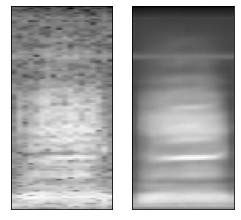

In [191]:
plot_recimg(5, x_train, x_rec)

In [626]:
z_train = get_z(x_train)
tsne_em = tsne_embedding(z_train[:10000])

(46548, 10)
(10000, 2)


In [623]:
umap_em = umap_embedding(z_train)

(46548, 2)


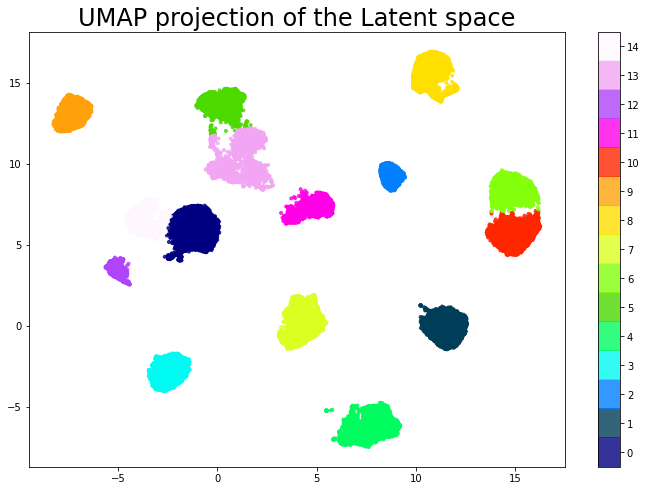

In [367]:
y_pred =kmeans_clustering(15, embedding,'gist_ncar')

In [606]:
import joblib
filename = '%s/umap/umap_model.sav'%load_dir
joblib.dump(reducer, filename)

['train_result/train_5//umap/umap_model.sav']

In [371]:
c_ncar=[
    'darkblue',
    'darkslategray',
    'dodgerblue',
    'aqua',
    'springgreen',
    'yellowgreen',
    'greenyellow',
    'yellow',
    'gold',
    'darkorange',
    'red',
    'magenta',
    'mediumorchid',
    'violet',
    'lightpink'
    
]
len(c_ncar)

15

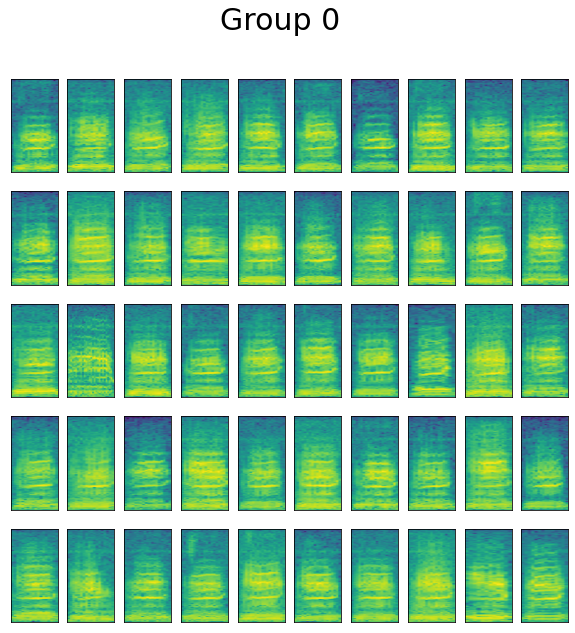

(4759, 3)


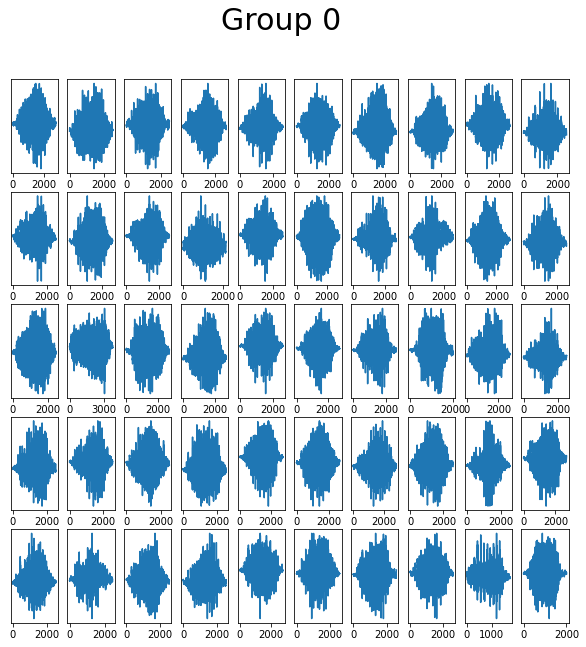

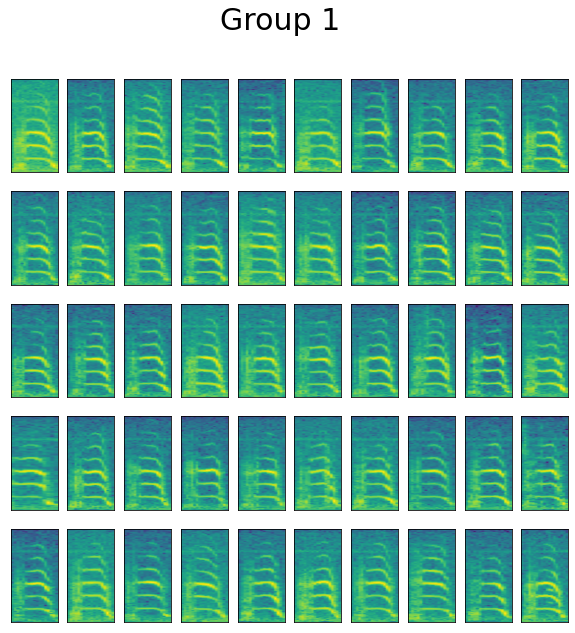

(3461, 3)


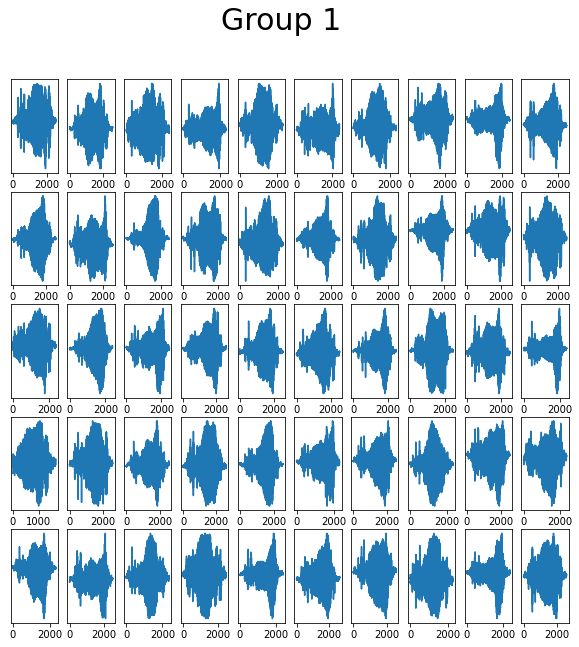

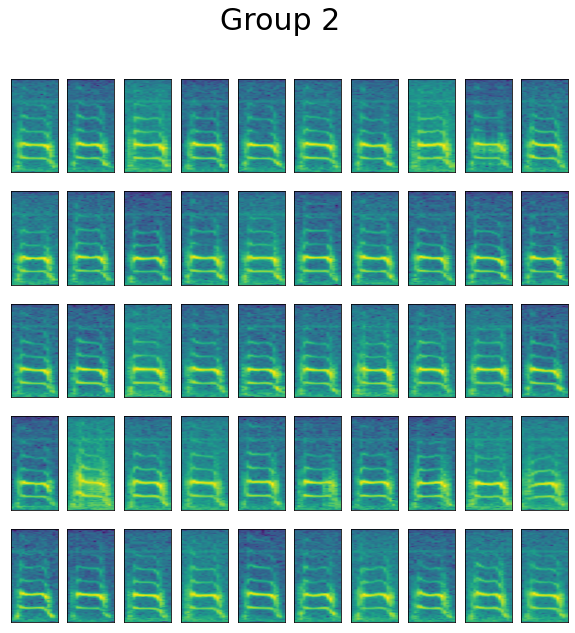

(1505, 3)


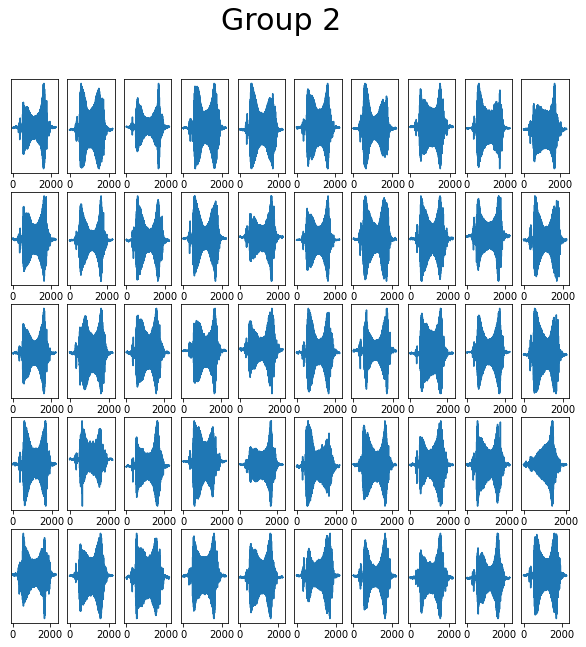

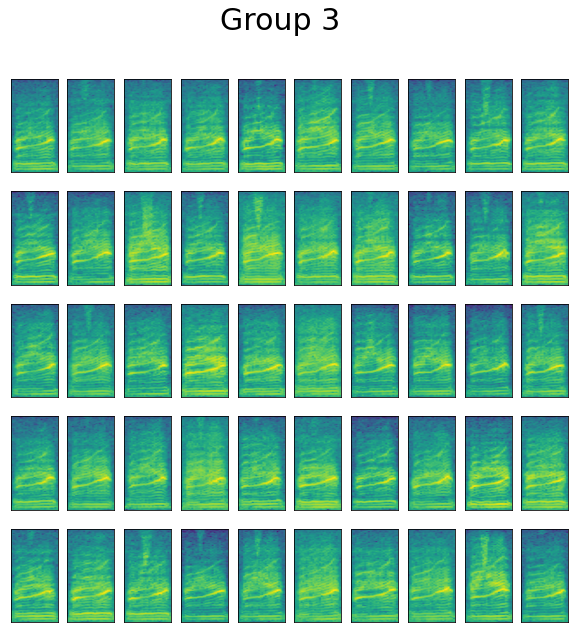

(2715, 3)


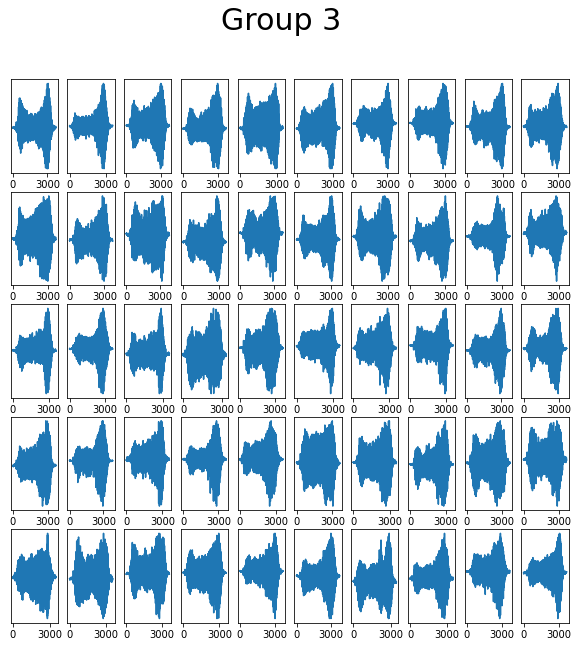

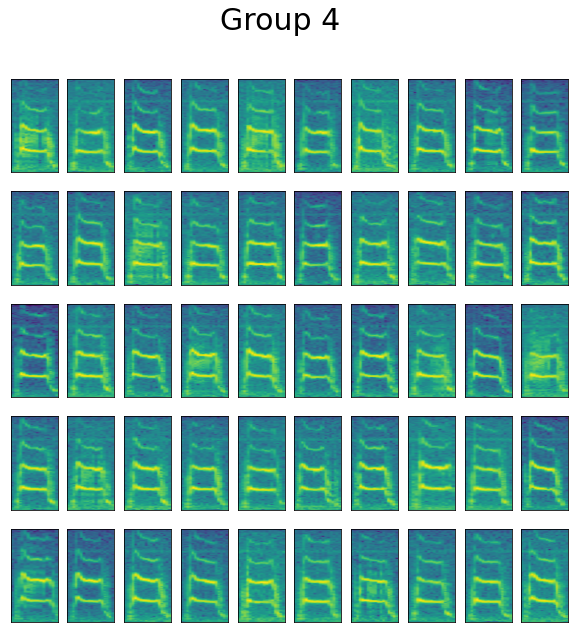

(4080, 3)


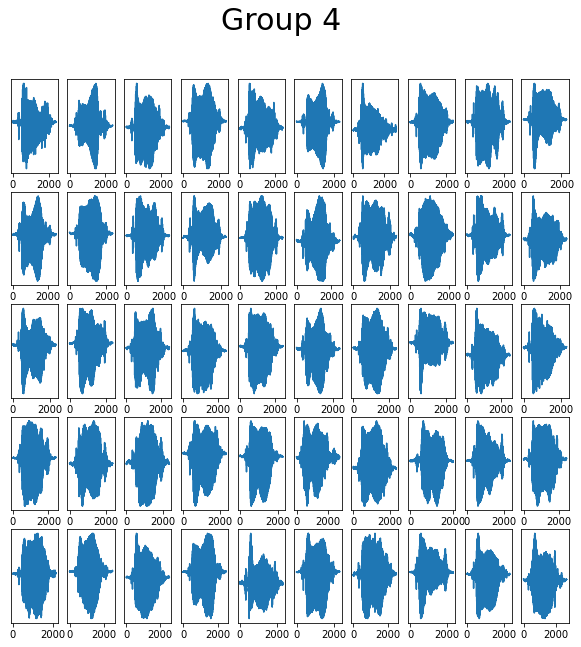

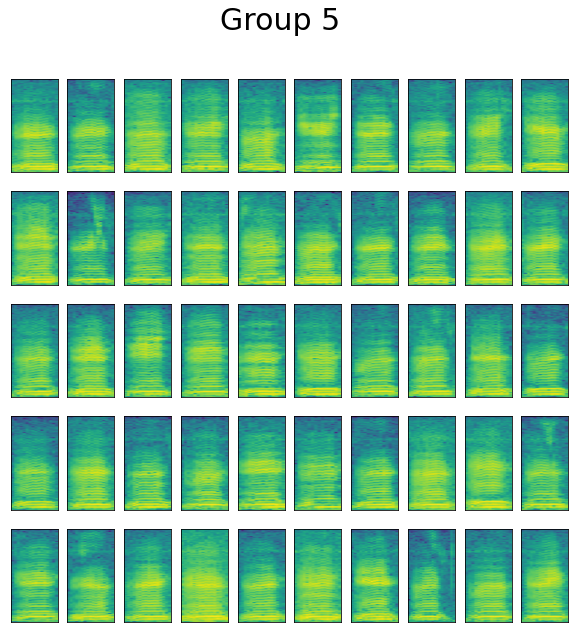

(2791, 3)


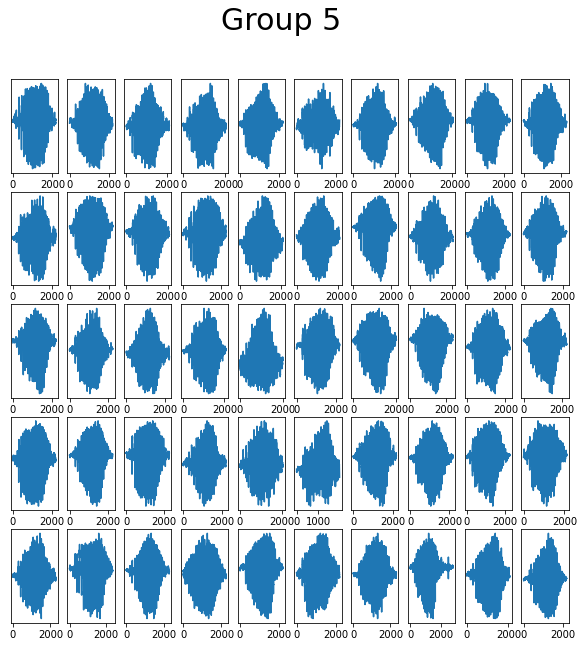

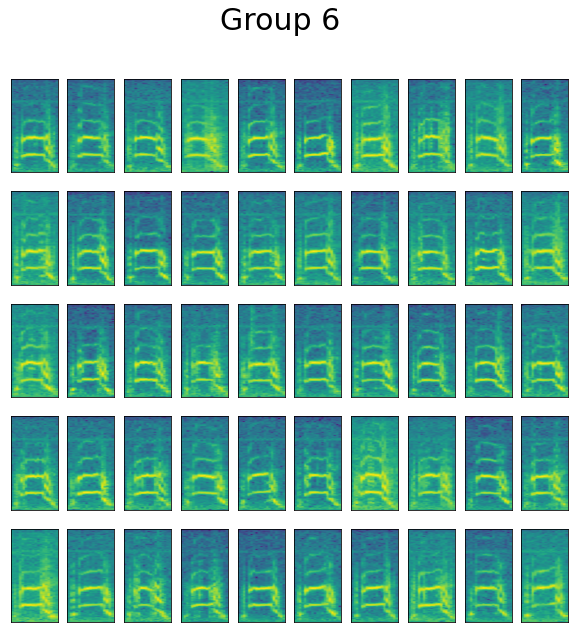

(3582, 3)


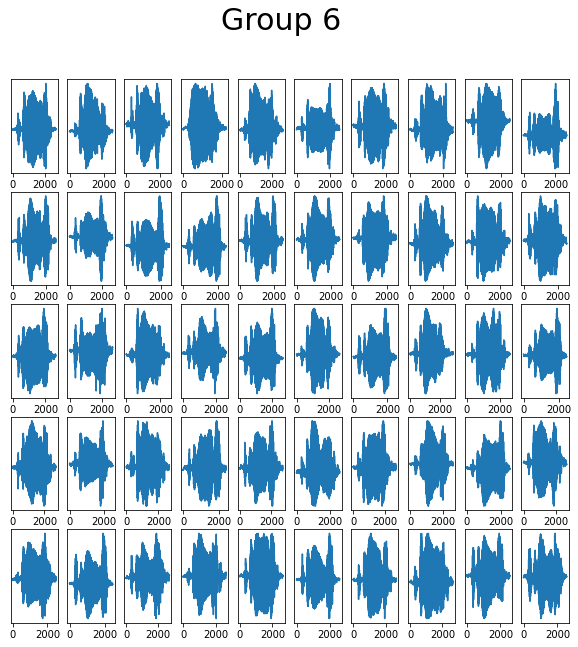

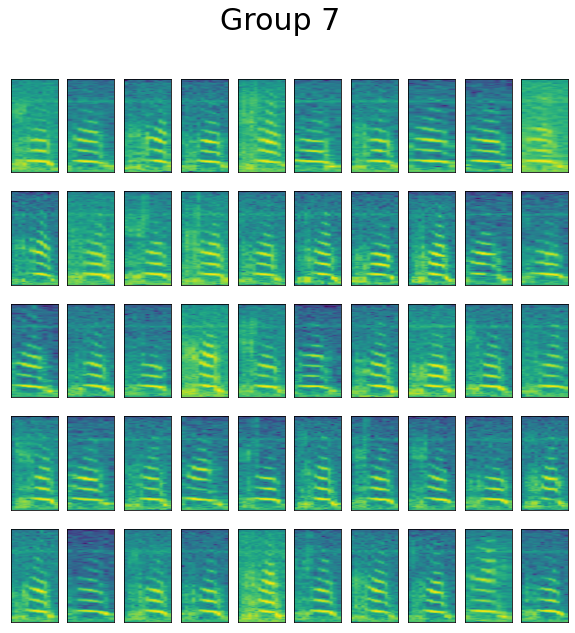

(3608, 3)


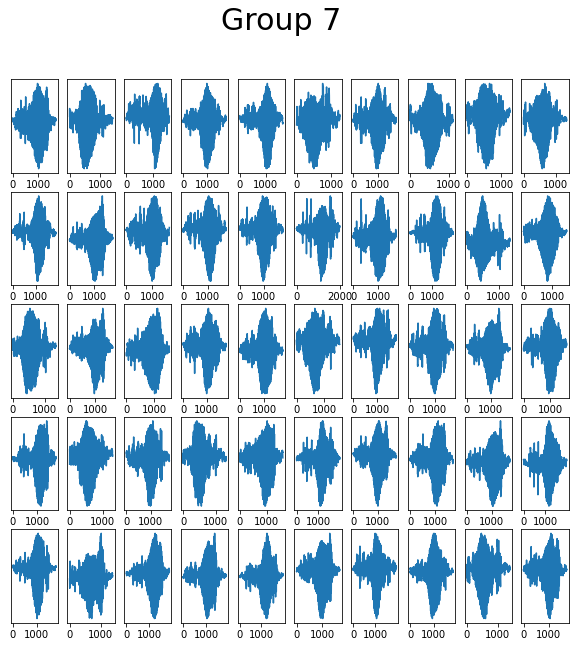

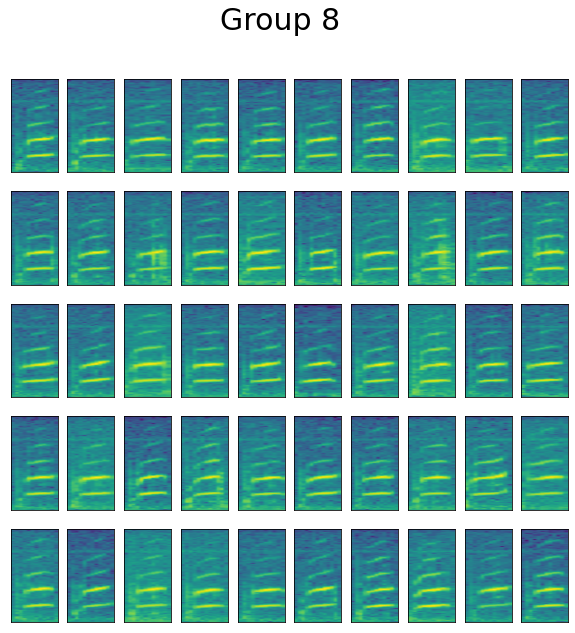

(3772, 3)


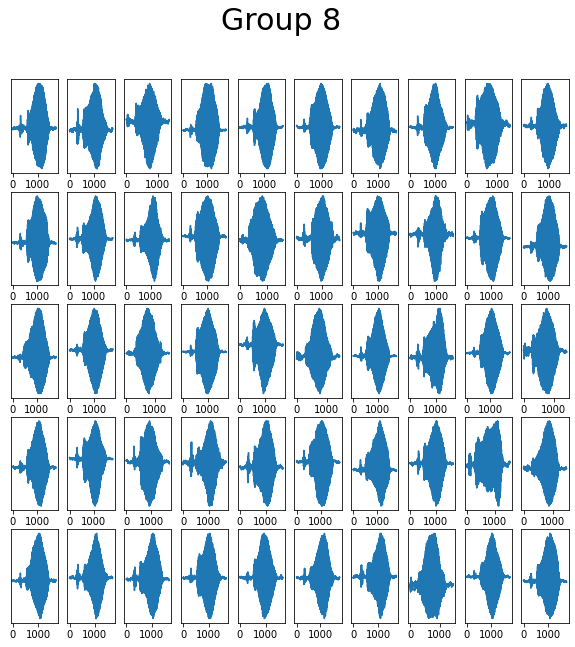

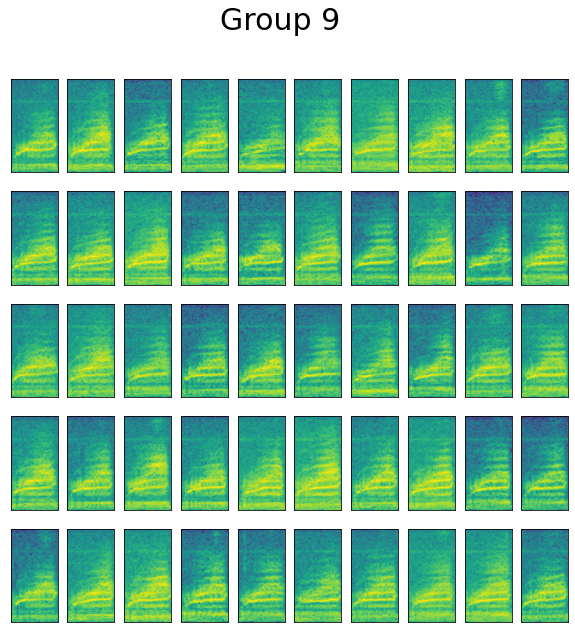

(2630, 3)


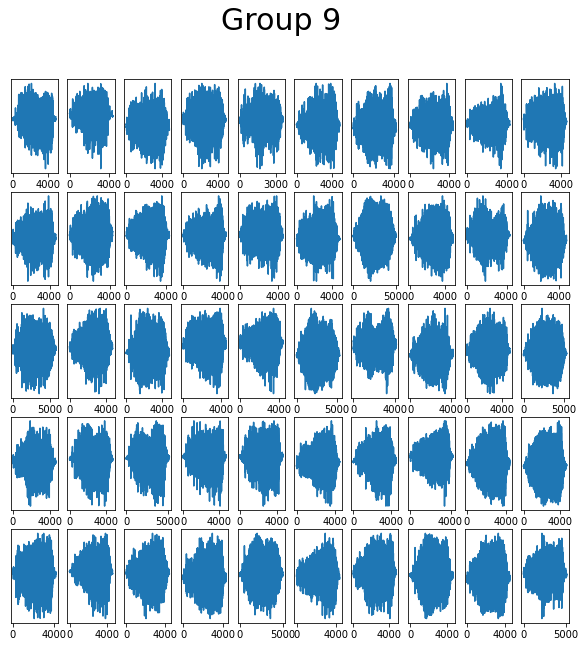

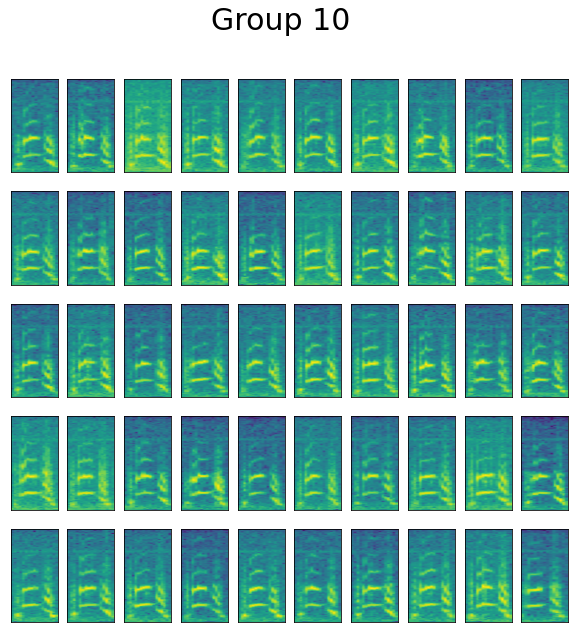

(3600, 3)


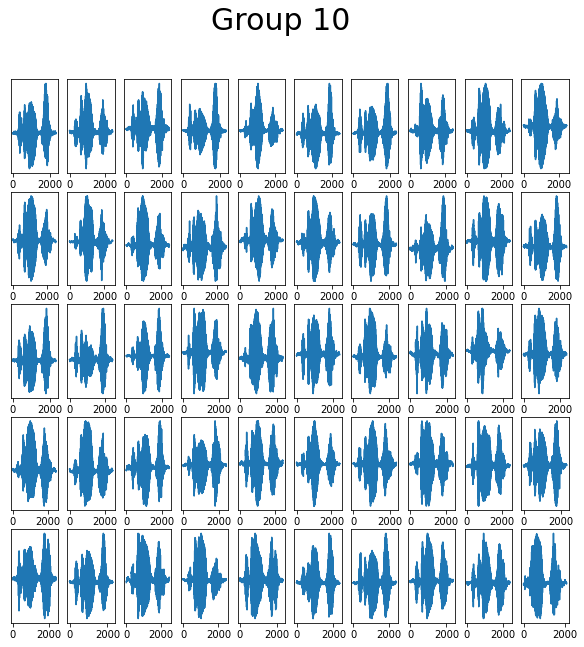

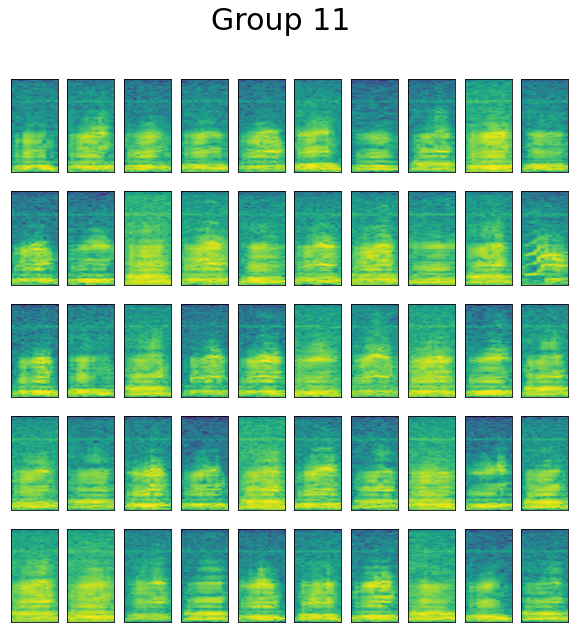

(2515, 3)


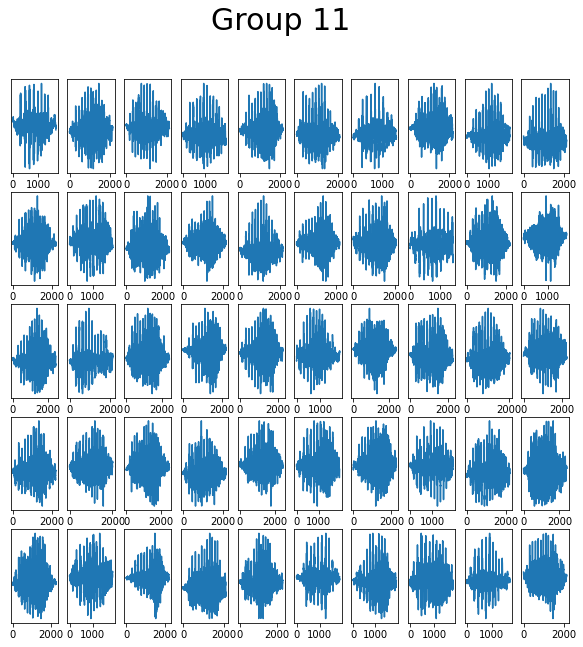

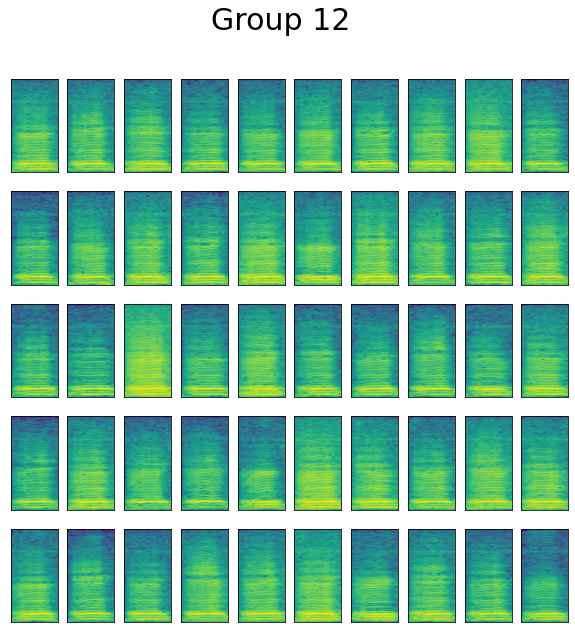

(1138, 3)


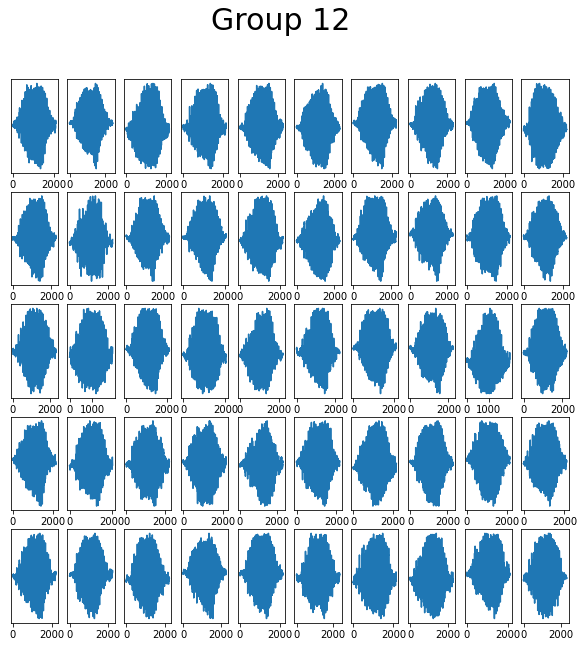

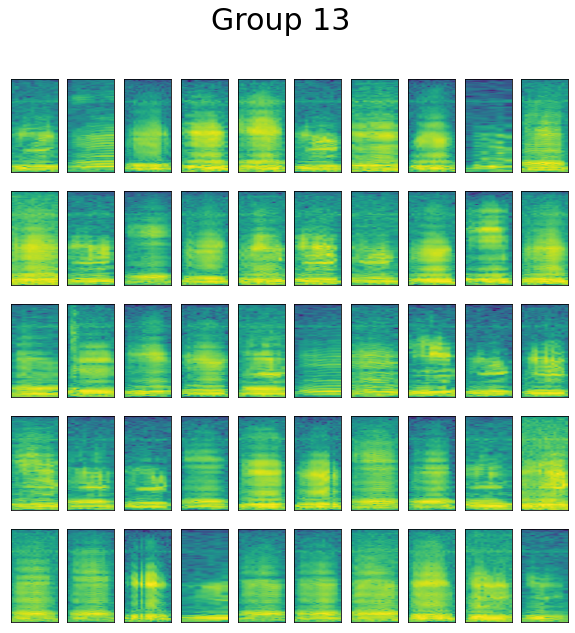

(4254, 3)


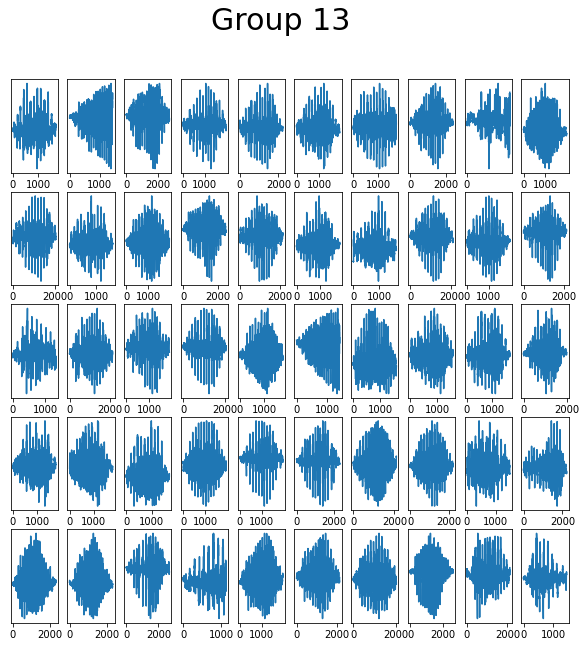

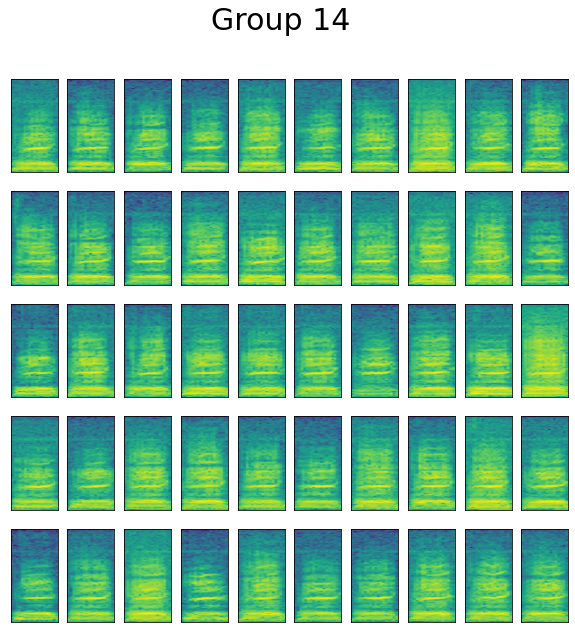

(2138, 3)


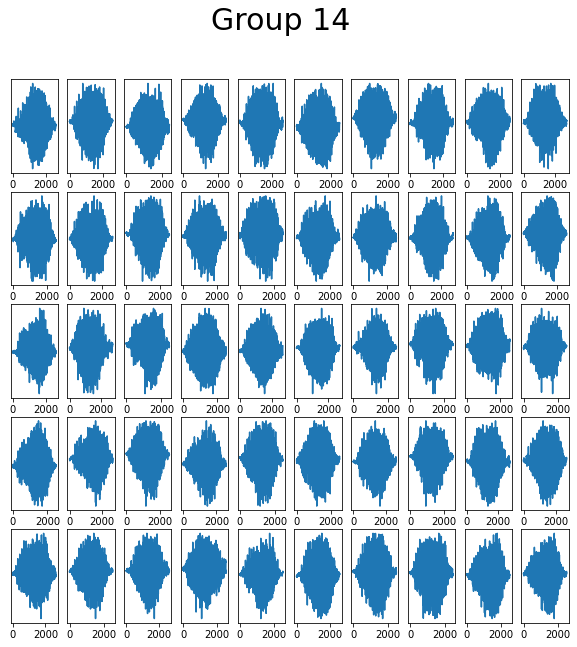

IndexError: index 0 is out of bounds for axis 0 with size 0

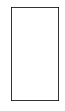

In [375]:
for idx in range(16):
    plot_group(x_train, y_pred, idx, load_dir+'/umap/')
    plot_group_wav(i_train, x_name, y_pred, idx, load_dir+'/umap/')

In [244]:
from scipy.io import wavfile
def get_val(wav_info, wav_name, idx):
    wav_name = wav_name[wav_info[idx][0]]
    start=wav_info[idx][1]
    lenth=wav_info[idx][2]
    end = start+lenth

    wav_path = 'data/w58y67/org/'+wav_name.split('_')[1]
    wav_file = wav_path+'/'+wav_name+'.wav'
    
    x, y = wavfile.read(wav_file)
    val = y[:,0][start:end]
    
    return lenth, val

def plot_group_wav(wav_info, wav_name, y_data, gidx, save=None):

    x, y = 5, 10
    fig = plt.figure(figsize=(y,x*2))

    cond = y_data == gidx
    g_info = wav_info[cond]
    print(g_info.shape)
    for i in range(x):
        for j in range(y):
            idx = i*y+j
            lenth, val = get_val(g_info, wav_name, idx)
            plt.subplot(x, y, idx+1)
            
            plt.xticks([0,  lenth-lenth%1000])
            plt.yticks([])
            plt.plot(val)
    fig.suptitle('Group %s'%(str(gidx)), fontsize=30)
    if save != None:
        plt.savefig(save+'gwav_%s'%(str(gidx)))
    plt.show()

In [387]:
def draw_lenth(groups, x_test, y_test, y_pred, title='Duration' ,save_dir=None):
    for i in groups:
        cond = y_pred==i
        gx = x_test[cond]
        gy = y_test[cond]
        plt.hist(gy[:,2], range=(0,6000), color = c_ncar[i], bins=50, alpha=0.5)
    #plt.title( '%i: %i'%(idx, len(gx)))
    plt.yticks([0,7000])
    
    plt.title(title)
    if save_dir != None:
        plt.savefig(save_dir)
    plt.show()

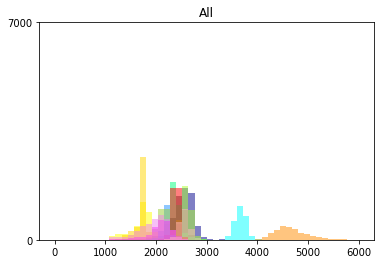

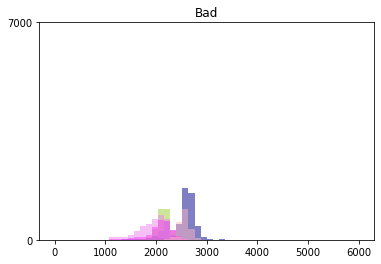

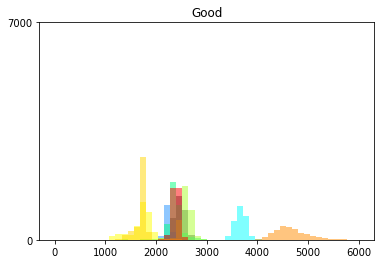

In [388]:
idx = [i for i in range(15)]
good_idx=[1,2,3,4,6,7,8,9,10]
bad_idx=[0,5,11,12,13,14]
draw_lenth(idx, x_train, i_train, y_pred, 'All', load_dir+'/umap/duration_all')
draw_lenth(bad_idx, x_train, i_train, y_pred, 'Bad', load_dir+'/umap/duration_bad')
draw_lenth(good_idx, x_train, i_train, y_pred, 'Good', load_dir+'/umap/duration_good')

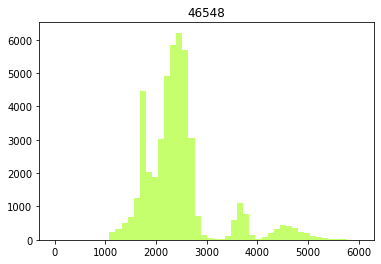

In [319]:
plt.title( len(i_train))
plt.hist(i_train[:,2], range=(0,6000), bins=50, color = c_base, alpha=0.7)
plt.savefig('%s/umap/duration'%load_dir)
plt.show()

In [390]:
x_train.shape, embedding.shape, y_pred.shape

((46548, 128, 64, 1), (46548, 2), (46548,))

In [569]:
a1= y_pred==6
a2= y_pred==10
b= y_pred==1
c= y_pred==4
e= y_pred==2
d= y_pred==8
f= y_pred==7
g= y_pred==3
h= y_pred==9

i1 = ((y_pred==5) | (y_pred==13))
i2 = (y_pred==0) | (y_pred==14)
i3 = y_pred==11
i4 = y_pred==12

mask_list=[a1,a2,b,c,d,e,f,g,h,i1,i2,i3,i4]
mask_good=[a1,a2,b,c,d,e,f,g,h]
mask_bad=[i1,i2,i3,i4]
mask_name=['a1','a2','b','c','d','e','f','g','h','i1','i2','i3','i4']
mask_color=[
            'magenta','pink',
            'red', 'orange', 
            'green','greenyellow','yellow','brown',
            'aqua',
            'darkslateblue','purple','dodgerblue','slategray'
]

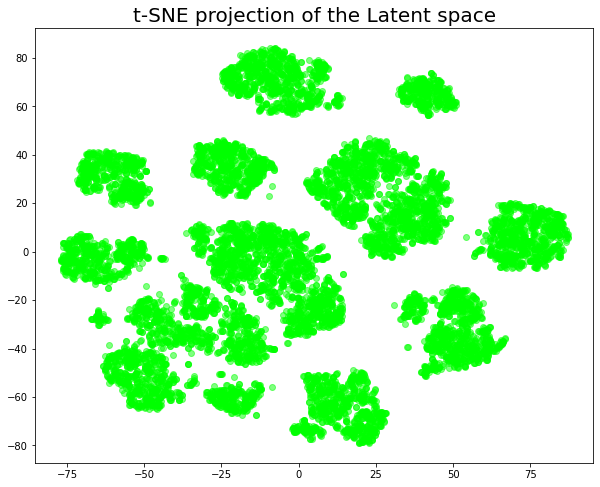

In [627]:
plt.figure(figsize=(10,8))
ax = plt.subplot()
plt.scatter(tsne_em[:,0], tsne_em[:,1], c='lime', alpha=0.5, label=name)
plt.title('t-SNE projection of the Latent space', fontsize=20)
#plt.legend(prop={'size': 12 })
plt.show()

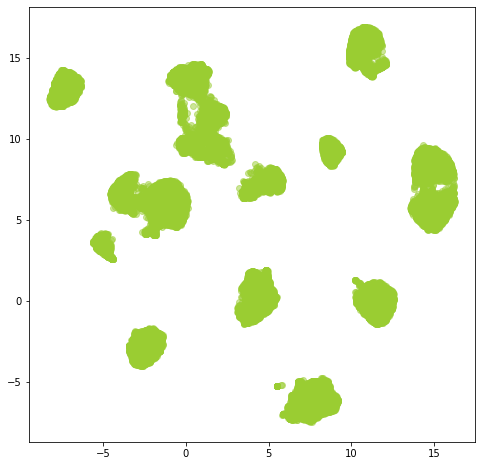

In [635]:
plt.figure(figsize=(8,8))
ax = plt.subplot()
plt.scatter(embedding[:,0], embedding[:,1], c='yellowgreen', alpha=0.5, label=name)
#plt.title('UMAP projection of the Latent space', fontsize=20)
#plt.legend(prop={'size': 12 })
plt.show()

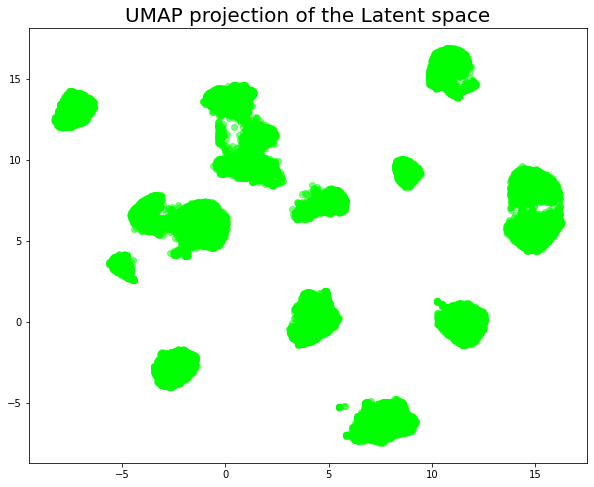

In [616]:
plt.figure(figsize=(10,8))
ax = plt.subplot()
for mask, color, name in zip(mask_list, mask_color, mask_name):
    plt.scatter(embedding[mask][:,0], embedding[mask][:,1], c='lime', alpha=0.5, label=name)
plt.title('UMAP projection of the Latent space', fontsize=20)
#plt.legend(prop={'size': 12 })
plt.show()

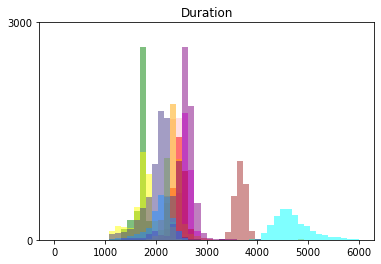

In [563]:

for mask, color in zip(mask_list, mask_color):
    gx = x_train[mask]
    gy = i_train[mask]
    plt.hist(gy[:,2], range=(0,6000), color=color, bins=50, alpha=0.5)

plt.title('Duration')
plt.yticks([0,3000])
plt.savefig(load_dir+'umap/duration_all')
plt.show()

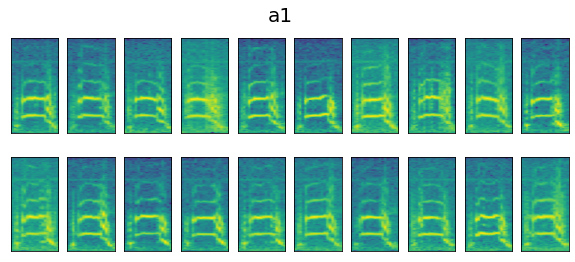

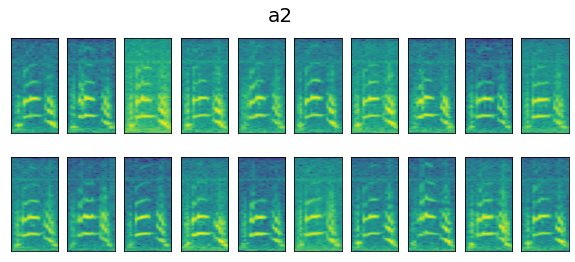

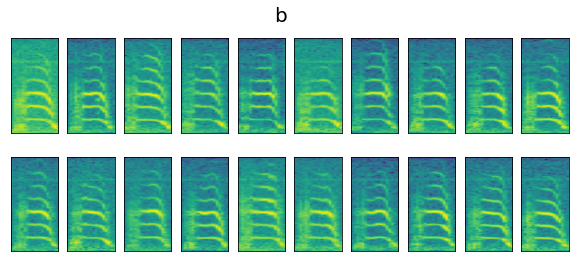

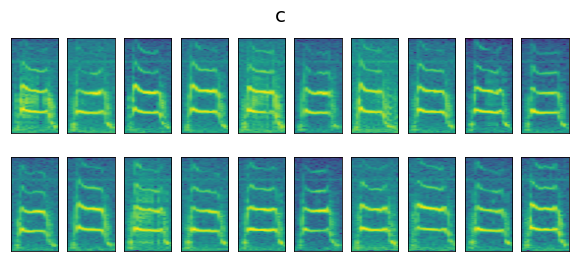

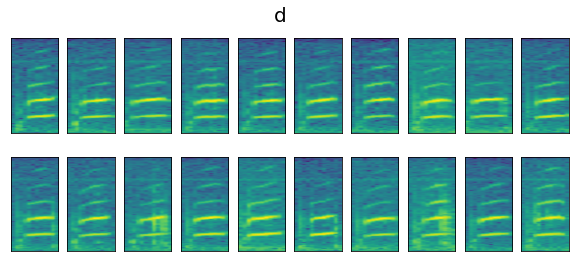

...

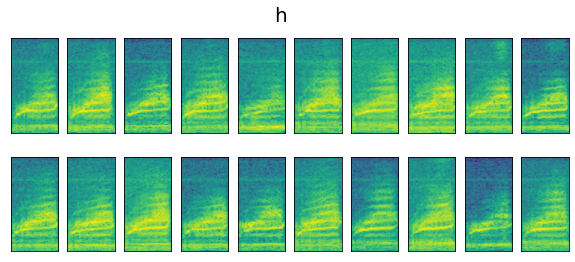

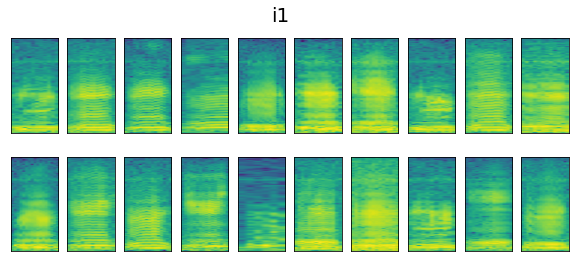

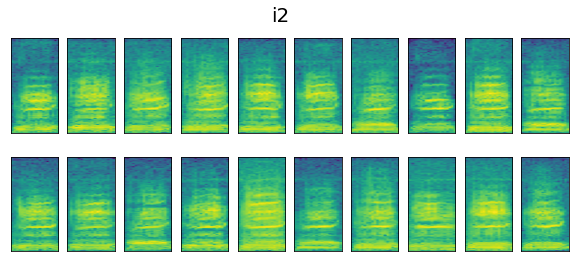

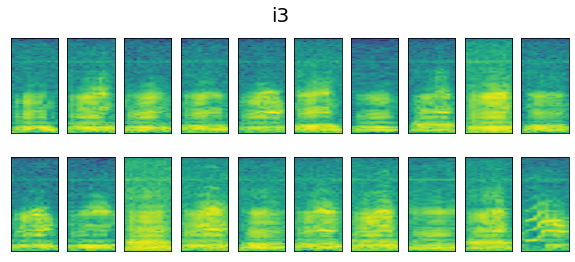

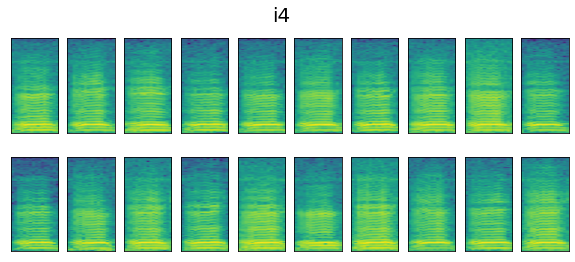

In [600]:
for g_idx in range(len(mask_list)):
    x, y = 2,10 
    fig = plt.figure(figsize=(y,x*2))
    g_data = x_train[mask_list[g_idx]]
    for i in range(x):
        for j in range(y):
            idx = i*y+j
            plt.subplot(x, y, idx+1)
            plt.xticks([])
            plt.yticks([])
            img = convert_shape(g_data[idx], -1)
            plt.imshow(img)
    fig.suptitle(mask_name[g_idx], fontsize=20)
    plt.savefig(load_dir+'umap/plot_specto_%s'%mask_name[g_idx])
    plt.show()

(3582, 3)


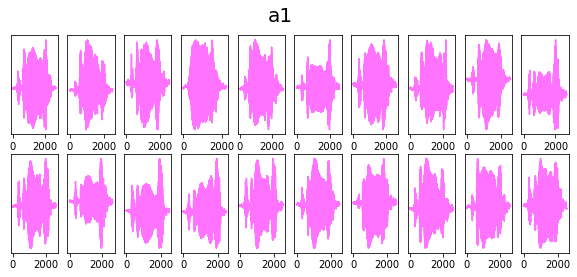

(3600, 3)


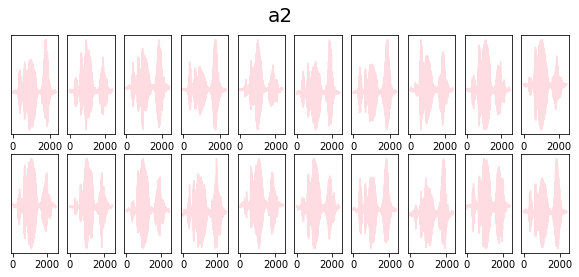

(3461, 3)


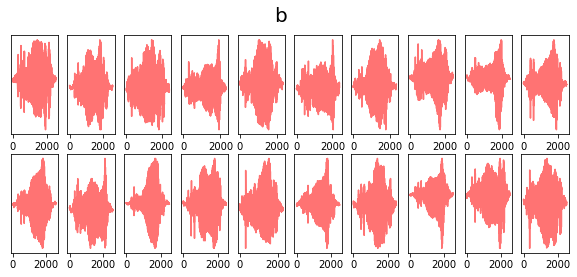

(4080, 3)


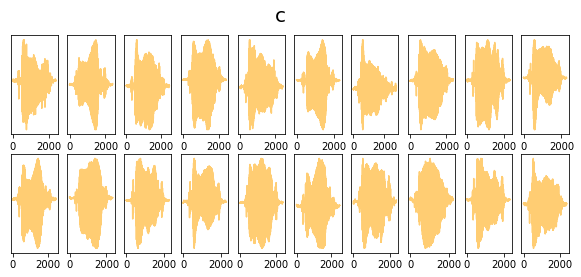

(3772, 3)


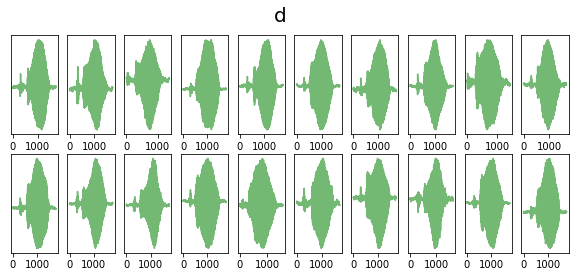

(1505, 3)


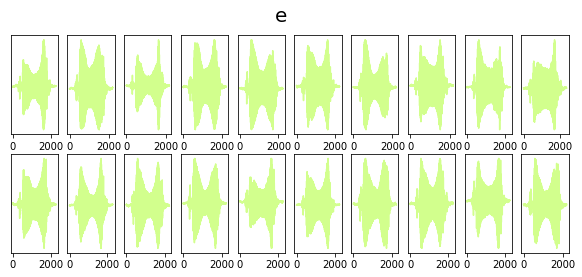

(3608, 3)


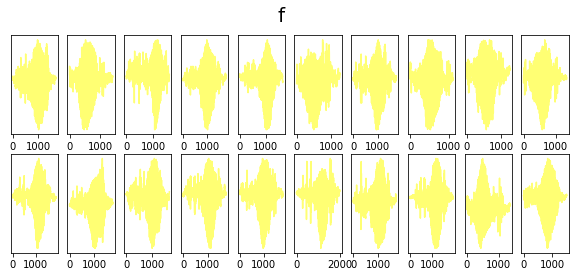

(2715, 3)


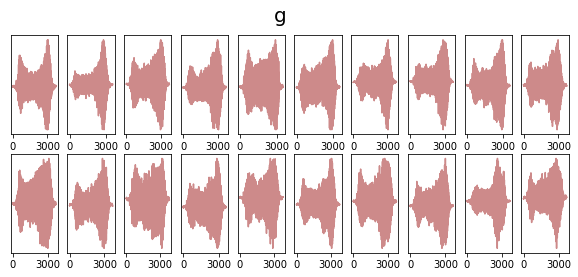

(2630, 3)


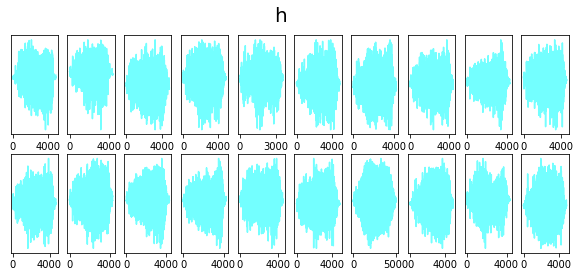

(7045, 3)


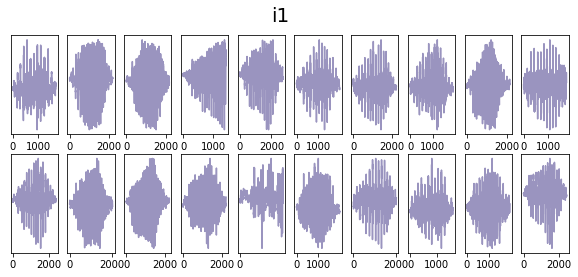

(6897, 3)


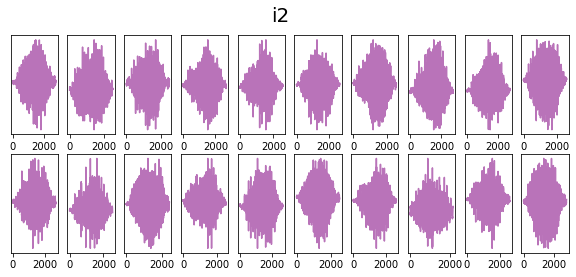

(2515, 3)


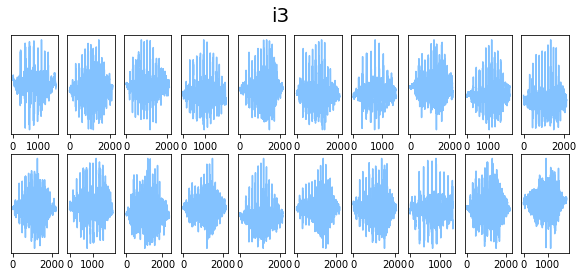

(1138, 3)


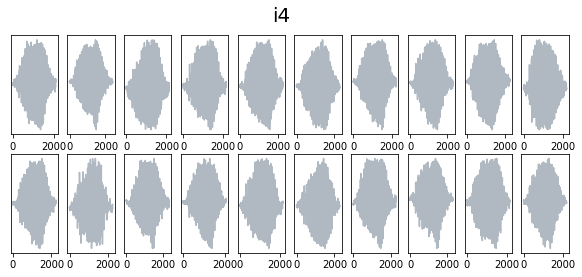

In [604]:

for g_idx in range(len(mask_list)):

    x, y = 2, 10
    fig = plt.figure(figsize=(y,x*2))

    g_info = i_train[mask_list[g_idx]]
    print(g_info.shape)
    for i in range(x):
        for j in range(y):
            idx = i*y+j
            lenth, val = get_val(g_info, x_name, idx)
            plt.subplot(x, y, idx+1)

            plt.xticks([0,  lenth-lenth%1000])
            plt.yticks([])
            plt.plot(val, c=mask_color[g_idx], alpha=0.55)
    fig.suptitle(mask_name[g_idx], fontsize=20)
    plt.savefig(load_dir+'umap/plot_wav_%s'%mask_name[g_idx])
    
    plt.show()